In [1]:
import sys, os
HARREMAN_SRC = "/home/access/PycharmProjects/Harreman/src"
if HARREMAN_SRC not in sys.path:
    sys.path.insert(0, HARREMAN_SRC)

# Metabolic zonation and crosstalk on the 10x Visium mouse colon dataset

In this tutorial we apply **Harreman** to identify metabolic zonation in a 10x Visium mouse colon dataset. Harreman reconstructs molecular metabolic crosstalk from spatially resolved transcriptomics by detecting genes whose expression is spatially autocorrelated, grouping them into co-expressed modules, and testing whether those modules correspond to coherent metabolic programs that exchange metabolites across tissue compartments.

The analysis is organized into three stages:

1. **Metabolic zonation** — discover spatially coherent gene modules and assign each tissue spot to a dominant metabolic zone.
2. **Pathway enrichment** — annotate gene modules with KEGG metabolic pathways using VISION.
3. **Metabolic crosstalk inference** — identify metabolite-transporter and ligand–receptor pairs with significant spatial co-expression.

**Steps in this tutorial:**

1. Loading the data.
2. Filtering out lowly expressed genes.
3. Computing metabolic enzyme autocorrelation to identify spatially variable genes.
4. Computing local correlations between spatially variable genes to identify co-expression modules.
5. Computing module scores and visualizing them across the tissue slides.
6. Grouping similar modules into super-modules.
7. Assigning the dominant super-module to every spot.
8. Characterizing super-module abundance along the proximal-distal and serosa-luminal axes.
9. Charaterizing modules with KEGG metabolic pathways (VISION).
10. Inferring cell-type-agnostic metabolic crosstalk.
11. Grouping spatially co-localized metabolites into metabolite groups.

## Loading the dataset

We work with a **mouse colon dataset** from Parigi et al. (*Nature Communications*, 2022), profiled with 10x Visium (55 µm spots, 6,168 spots in total across two sections). The experiment used a Dextran Sulfate Sodium (DSS)-induced colitis model:

- **Day 0 (d0):** healthy colon, before DSS administration.
- **Day 14 (d14):** early regeneration phase, 14 days after peak inflammation.

Each colon was sectioned using the **Swiss roll** protocol — the tissue is rolled from proximal to distal end and then cut transversally — allowing the entire colon to fit on one Visium capture area. Pre-computed unrolled coordinates (stored in `obsm['spatial_unrolled']`) are used for neighborhood graph construction because they better preserve the true *in vivo* spatial relationships of the tissue.

The raw data are from https://github.com/ludvigla/healing_intestine_analysis. Full-resolution H&E images (required for digital unrolling) can be downloaded from GEO accession GSM5213483 (Day 0) and GSM5213484 (Day 14) and placed under the `spatial/` folder.

In [2]:
# Standard imports
import sys, os
from scvi.external import HarremanAnalysis
import tempfile
import json
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import itertools
#import mplscience
from scipy.stats import hypergeom, zscore, norm, pearsonr, wilcoxon, mannwhitneyu, spearmanr
from statsmodels.stats.multitest import multipletests
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.utils import resample
import random
import scipy.stats as stats
from sklearn import linear_model
from statsmodels.stats.multitest import multipletests
# from plotnine import *
import warnings
import gc
gc.collect()
import torch
from scvi.external.harreman.datasets import load_visium_mouse_colon_dataset
from scvi.external.harreman.preprocessing import read_h5ad, write_h5ad
torch.cuda.empty_cache()
warnings.filterwarnings("ignore")

We load the complete dataset (both conditions) with a single call. Individual samples can be loaded by passing the `sample` argument — for example, to load only the healthy condition:

```python
adata = load_visium_mouse_colon_dataset(sample='d0')
```

Here we load both conditions together, which is required for the joint neighborhood graph and module discovery steps below.

In [3]:
adata = load_visium_mouse_colon_dataset()

In [4]:
adata

AnnData object with n_obs × n_vars = 6168 × 31053
    obs: 'in_tissue', 'array_row', 'array_col', 'cond', 'id', 'row', 'col', 'layer', 'ord', 'dist', 'spot', 'pixel_x', 'pixel_y'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'cond_colors'
    obsm: 'spatial', 'spatial_unrolled'
    layers: 'counts', 'log_norm', 'normalized'

Before computing spatial statistics, we remove genes that are too sparsely expressed to provide reliable signal. A gene must be detected in at least **50 spots within at least one sample** to be retained. Applying the threshold per-sample (rather than across the pooled dataset) prevents condition-specific genes from being discarded just because they are absent in the other condition.

After filtering, the dataset shrinks from ~31,000 to ~14,000 genes.

In [5]:
sample_col = 'cond'
n_genes_expr = 50
# Union across samples: keep a gene if it passes the threshold in ANY sample
genes_to_keep = np.zeros(adata.shape[1], dtype=bool)

for sample in adata.obs[sample_col].unique():
    adata_sample = adata[adata.obs[sample_col] == sample]
    expressed = np.array((adata_sample.X > 0).sum(axis=0)).flatten()
    genes_to_keep |= expressed >= n_genes_expr  # bitwise OR accumulates across samples

adata = adata[:, genes_to_keep].copy()

In [6]:
adata

AnnData object with n_obs × n_vars = 6168 × 13967
    obs: 'in_tissue', 'array_row', 'array_col', 'cond', 'id', 'row', 'col', 'layer', 'ord', 'dist', 'spot', 'pixel_x', 'pixel_y'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'cond_colors'
    obsm: 'spatial', 'spatial_unrolled'
    layers: 'counts', 'log_norm', 'normalized'

## Helper functions

The `polynomial_regression` helper fits a degree-3 polynomial to the Z-scored super-module score along a spatial axis (proximal-distal or serosa-luminal) and reports 95% bootstrap confidence intervals. It is used later (Steps 8a–b) to visualize how each metabolic zone is distributed across the two anatomical gradients.

Line width of each curve is scaled by the fraction of spots assigned to that super-module, so dominant zones are visually prominent.

In [7]:
def polynomial_regression(adata, cond, super_modules, fraction_df, var, xlabel, y_min, y_max, degree = 3, figsize=(8, 6)):

    X = adata.obs[var].dropna().values.reshape(-1, 1)
    X_high_res = np.linspace(X.min(), X.max(), 500).reshape(-1, 1)

    plt.figure(figsize=figsize)
    
    mods_cond = fraction_df[fraction_df['cond'] == cond]['top_super_module'].tolist()
    
    p_values_uniform = []
    p_values_perm = []
    
    for mod in super_modules:
        
        if mod not in mods_cond:
            continue
        
        y = zscore(adata.obs[mod].loc[adata.obs[var].dropna().index].values)

        # Fit polynomial regression
        poly = PolynomialFeatures(degree=degree)
        X_poly = poly.fit_transform(X)

        model = LinearRegression()
        model.fit(X_poly, y)
        
        # Predict mean
        X_high_res_poly = poly.transform(X_high_res)
        y_pred = model.predict(X_high_res_poly)

        # Bootstrap resampling for confidence intervals
        n_bootstrap = 1000
        bootstrap_preds = []

        for _ in range(n_bootstrap):
            X_sample, y_sample = resample(X, y)
            X_sample_poly = poly.fit_transform(X_sample)
            bootstrap_model = LinearRegression()
            bootstrap_model.fit(X_sample_poly, y_sample)
            bootstrap_preds.append(bootstrap_model.predict(X_high_res_poly))

        bootstrap_preds = np.array(bootstrap_preds)

        # Calculate 95% confidence intervals
        lower_bound = np.percentile(bootstrap_preds, 2.5, axis=0)
        upper_bound = np.percentile(bootstrap_preds, 97.5, axis=0)

        # Plot mean prediction and confidence interval
        line_width_factor = fraction_df[(fraction_df['cond'] == cond) & (fraction_df['top_super_module'] == mod)]['Fraction'].tolist()[0]
        plt.plot(X_high_res, y_pred, label=f'{mod} (Mean)', linewidth=8*line_width_factor)
        plt.fill_between(X_high_res.flatten(), lower_bound, upper_bound, alpha=0.2, label=f'{mod} (95% CI)')
        plt.ylim(y_min, y_max)
    
    # Customize plot
    plt.xlabel(xlabel)
    plt.ylabel('Z-scored module score')
    plt.title(cond)
    
    return

## Metabolic zonation

### Step 1 — Build the spatial neighborhood graph

The first step is to define a local neighborhood for each tissue spot. We use `compute_knn_graph` to construct a *k*-nearest-neighbor graph in the **unrolled** tissue coordinate space (`spatial_unrolled`). Unrolled coordinates are preferred over the original Swiss-roll coordinates because they faithfully preserve the proximal-distal and serosa-luminal *in vivo* distances.

Key parameters:
- `n_neighbors=5` — each spot shares edges with its 5 nearest spatial neighbors. Smaller values capture finer spatial patterns; larger values increase robustness at the cost of spatial resolution.
- `weighted_graph=False` — binary (0/1) edge weights; no distance-based down-weighting.
- `sample_key='cond'` — prevents edges from bridging the two tissue sections (Day 0 and Day 14).

In [8]:
ha = HarremanAnalysis(adata)
# Build 5-NN graph in unrolled spatial coordinates; restrict edges within each sample
ha.tl.compute_knn_graph(compute_neighbors_on_key="spatial_unrolled", 
                           n_neighbors=5,
                           weighted_graph=False,
                           sample_key='cond',
                           verbose=True)

Computing the neighborhood graph...
Restricting graph within samples using 'cond'...


100%|██████████| 2/2 [00:00<00:00, 88.09it/s]

Computing the weights...
Finished computing the KNN graph in 0.040 seconds


### Step 2 — Compute spatial autocorrelation for metabolic enzymes

We restrict the analysis to **metabolic enzymes** (`use_metabolic_genes=True`, `species='mouse'`) and test each gene for spatial autocorrelation using `compute_local_autocorrelation`. A gene is spatially autocorrelated if its expression in a spot is consistently similar to that of its spatial neighbors — the hallmark of a spatially structured pattern rather than random noise.

The **DANB (Depth-Adjusted Negative Binomial)** model (`model='danb'`) is used to account for the overdispersion and variable sequencing depth typical of Visium data.

Results are stored in `adata.uns['gene_autocorrelation_results']` as a table of Z-scores and FDR-adjusted p-values.

In [9]:
ha.hs.compute_local_autocorrelation(layer_key="counts", model='danb', species='mouse', use_metabolic_genes=True, verbose=True)

Computing local autocorrelation...
Local autocorrelation results are stored in adata.uns['gene_autocorrelation_results']
Finished computing local autocorrelation in 0.351 seconds


Only genes with a **statistically significant spatial autocorrelation** (FDR < 0.01) are carried forward. This keeps the pairwise correlation computation tractable and focuses the analysis on genes with a genuine spatial pattern.

In [10]:
gene_autocorrelation_results = adata.uns['gene_autocorrelation_results']
# Keep only genes with significant spatial autocorrelation (FDR < 0.01)
genes = gene_autocorrelation_results.loc[
    gene_autocorrelation_results.Z_FDR < 0.01
].sort_values('Z', ascending=False).index

### Step 3 — Compute pairwise local correlations

We now test whether pairs of spatially autocorrelated genes are **co-expressed within the same local neighborhood** using `compute_local_correlation`. Unlike standard Pearson correlation, *local* correlation measures whether two genes are co-expressed specifically in spots that are spatially adjacent — distinguishing true spatial co-regulation from global co-expression driven by cell-type composition.

The function returns a gene × gene matrix of Z-scores stored in `adata.uns['lc_zs']`. Only the 759 autocorrelated genes from the previous step are compared, keeping computation fast.

In [11]:
ha.hs.compute_local_correlation(genes=genes, verbose=True)

Computing pair-wise local correlation on 759 features...
Pair-wise local correlation results are stored in adata.uns with the following keys: ['lcs', 'lc_zs', 'lc_z_pvals', 'lc_z_FDR']
Finished computing pair-wise local correlation in 0.324 seconds


### Step 4 — Group locally co-expressed genes into modules

`create_modules` performs **agglomerative hierarchical clustering** on the pairwise local-correlation Z-score matrix. Two stopping rules prevent over-merging:

1. Two branches are **not merged** if the FDR-adjusted p-value of their pairwise correlation exceeds `fdr_threshold` (default 0.05).
2. Two branches are **not merged** if both have at least `min_gene_threshold` genes — this preserves distinct spatial patterns rather than collapsing them into one large noisy module. Ambiguous genes (those that would connect the two branches) are either left unassigned (`core_only=True`) or assigned to the sparser module (`core_only=False`; default).

`min_gene_threshold=20` ensures each retained module has enough genes to compute a reliable score.

In [12]:
ha.hs.create_modules(min_gene_threshold=20)

The local correlation heatmap shows genes grouped by module. Warm colors indicate strong positive local co-expression; cool colors indicate anti-correlation. Genes within the same module share a coherent spatial expression pattern.

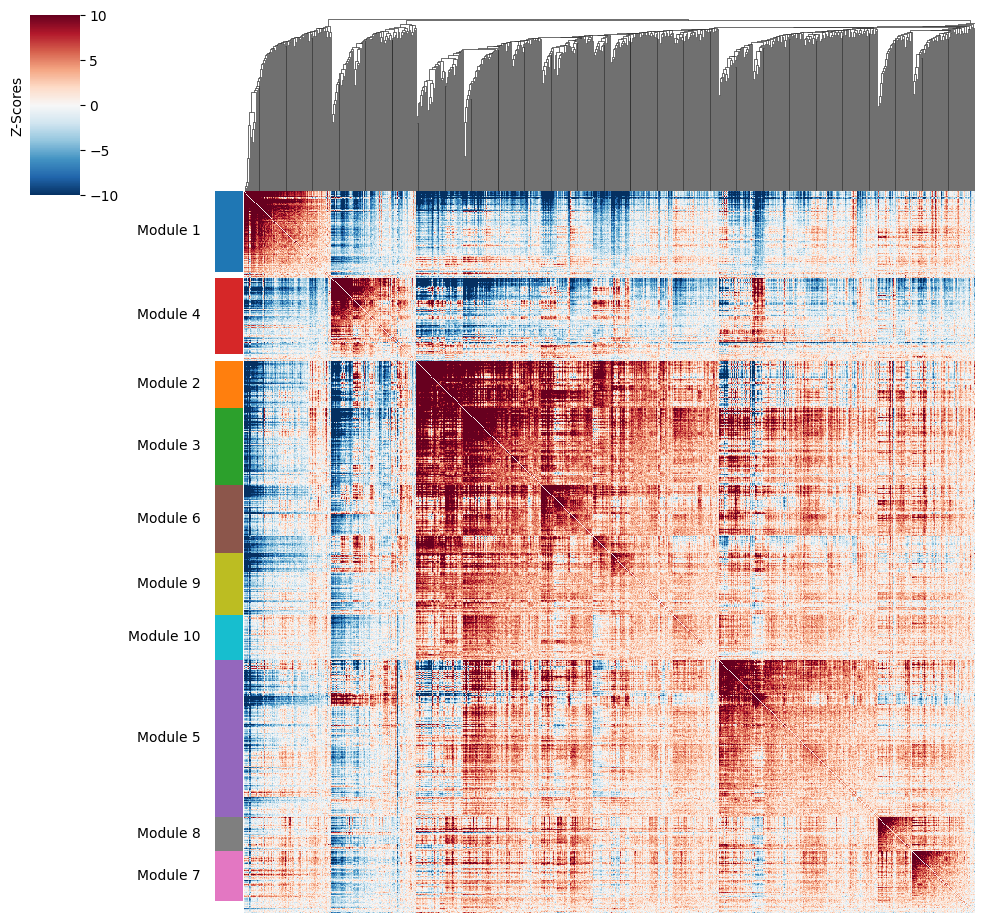

In [13]:
ha.pl.local_correlation_plot()

### Step 5 — Compute and visualize module scores

`calculate_module_scores` summarizes each module into a single per-spot score using the same approach as the original Hotspot algorithm: a weighted sum of the module's gene expression values, projected onto the first principal component of local co-expression. Higher scores indicate that the module's characteristic gene program is active in that spot.

Scores are stored in `adata.obsm['module_scores']`.

In [14]:
ha.hs.calculate_module_scores()

100%|██████████| 10/10 [00:02<00:00,  4.60it/s]


In [15]:
# Copy module scores from obsm to obs so they can be passed directly to sc.pl.spatial
modules = adata.obsm['module_scores'].columns
adata.obs[modules] = adata.obsm['module_scores']

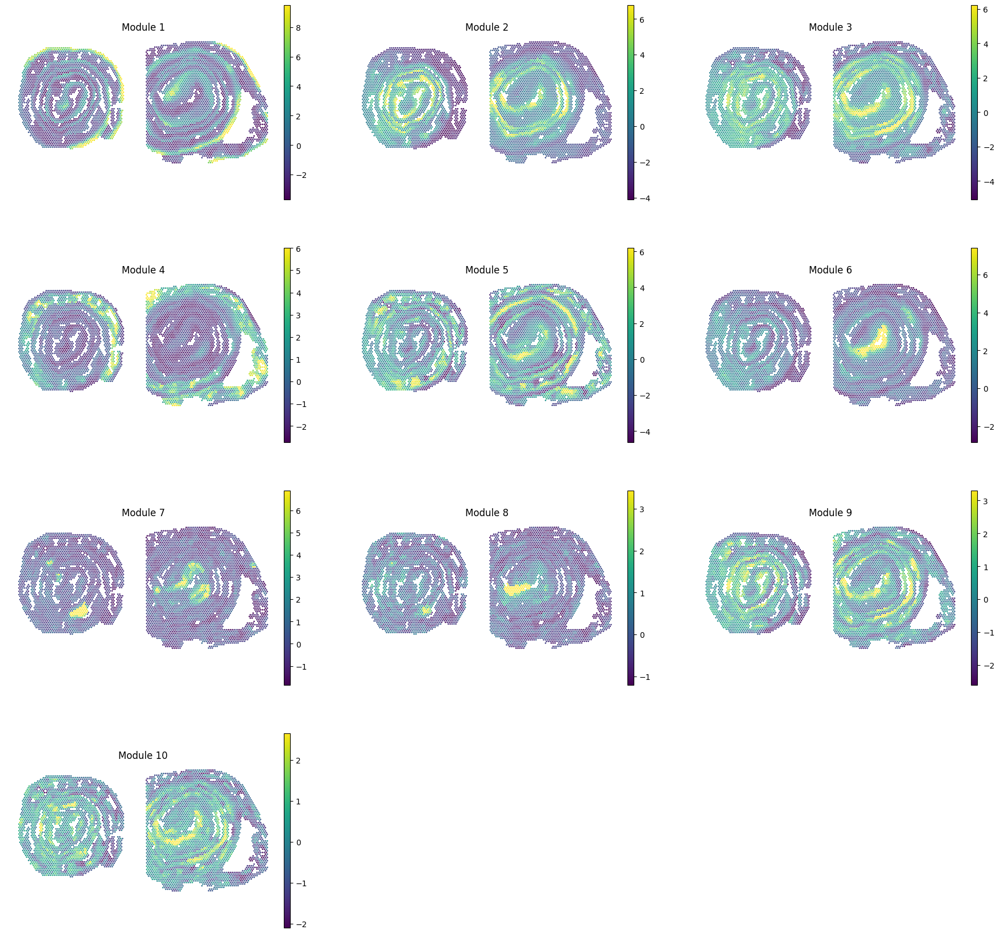

In [16]:
# Visualize all module scores across tissue spots; p1/p99 clip extreme values
sc.pl.spatial(adata, color=modules, spot_size=80, frameon=False, vmin="p1", vmax="p99", ncols=3, cmap='viridis')

### Step 6a — Compare modules by their average local correlation

The heatmap below shows the **average pairwise local-correlation Z-score between every pair of modules**. Modules with high inter-module correlation share a similar spatial pattern and are candidates for merging into a super-module. Modules with near-zero or negative average correlation are spatially distinct.

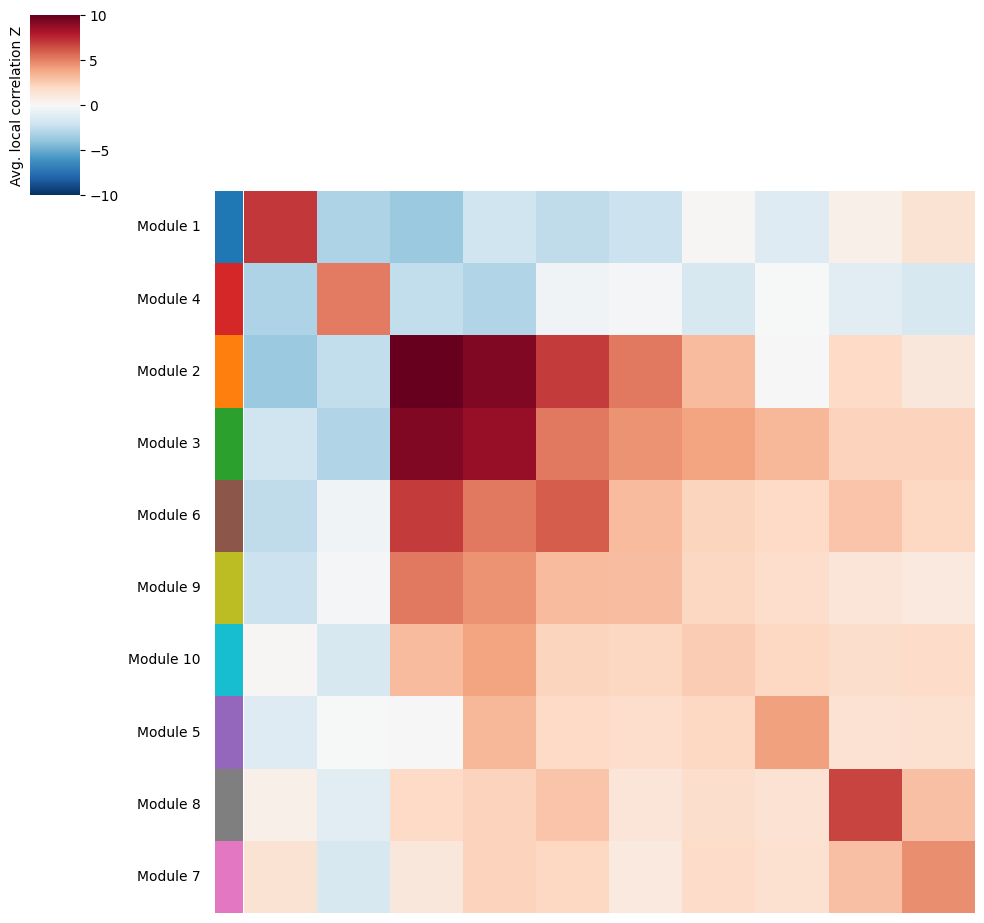

In [17]:
ha.pl.average_local_correlation_plot(col_cluster=False, row_cluster=False)

### Step 6b — Compare modules by their score correlation

As a complementary view, we correlate the **module scores** across spots. Unlike the local-correlation heatmap (which reflects the underlying gene-level statistics), this plot captures similarity in the overall spatial distribution of module activity — two modules may be spatially similar even if their constituent genes do not strongly co-express locally.

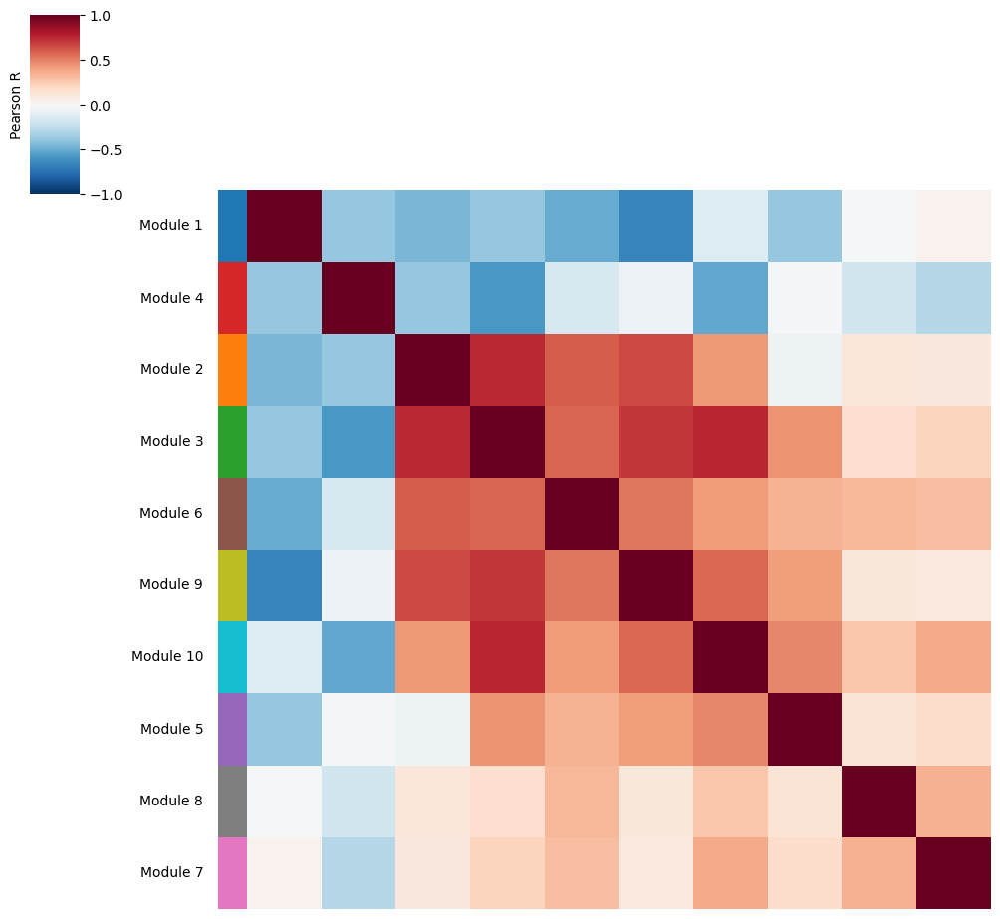

In [18]:
ha.pl.module_score_correlation_plot(col_cluster=False, row_cluster=False)

### Step 6c — Define super-modules

Based on the two comparison views above, we manually group related modules into **super-modules**. Super-modules pool genes from multiple related modules, resulting in a more robust and interpretable spatial score. The mapping is defined as a dictionary `{super_module_id: [module_id, ...]}`.

In [ ]:
# Define super-modules by grouping related modules (based on heatmaps above)
# Format: {super_module_id: [list of original module IDs to merge]}
super_module_dict = {
    1: [1],
    2: [2, 3],
    3: [4],
    4: [5],
    5: [6, 9, 10],
    6: [7],
    7: [8],
}

In [20]:
ha.hs.calculate_super_module_scores(super_module_dict=super_module_dict)

100%|██████████| 7/7 [00:01<00:00,  5.81it/s]

Finished computing super-module scores in 1.212 seconds


The pairwise local-correlation heatmap can be re-plotted at the super-module level to confirm that merged modules are indeed spatially coherent and that the remaining super-modules are sufficiently distinct from one another.

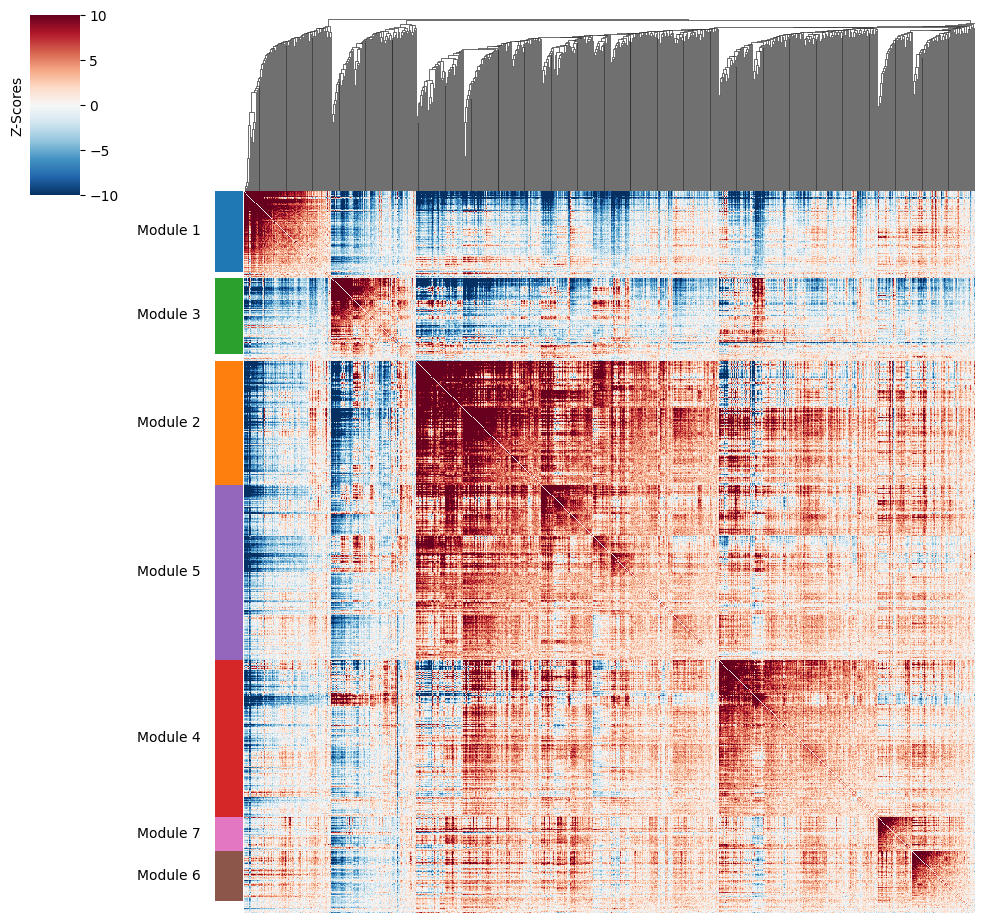

In [21]:
ha.pl.local_correlation_plot(use_super_modules=True, show=False)

Super-module scores are stored in `adata.obsm['super_module_scores']` and copied into `adata.obs` for convenient plotting with `sc.pl.spatial`.

In [22]:
# Copy super-module scores to obs for spatial visualization
super_modules = adata.obsm['super_module_scores'].columns
adata.obs[super_modules] = adata.obsm['super_module_scores']

[<Axes: title={'center': 'Module 1'}, xlabel='spatial1', ylabel='spatial2'>,
 <Axes: title={'center': 'Module 2'}, xlabel='spatial1', ylabel='spatial2'>,
 <Axes: title={'center': 'Module 3'}, xlabel='spatial1', ylabel='spatial2'>,
 <Axes: title={'center': 'Module 4'}, xlabel='spatial1', ylabel='spatial2'>,
 <Axes: title={'center': 'Module 5'}, xlabel='spatial1', ylabel='spatial2'>,
 <Axes: title={'center': 'Module 6'}, xlabel='spatial1', ylabel='spatial2'>,
 <Axes: title={'center': 'Module 7'}, xlabel='spatial1', ylabel='spatial2'>]

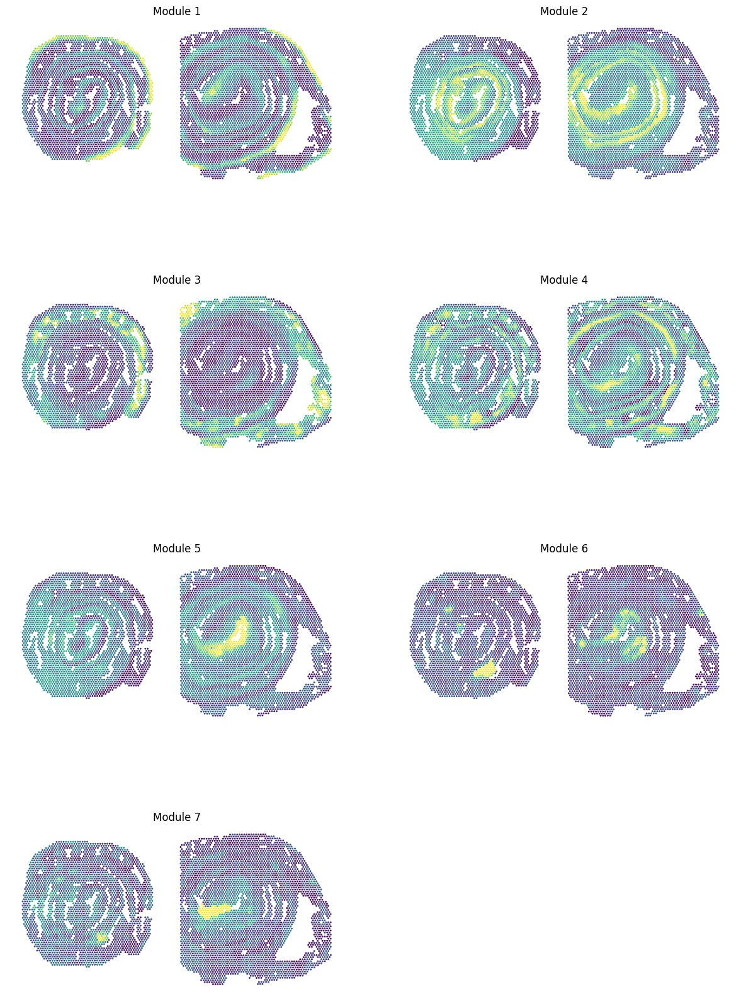

In [23]:
sc.pl.spatial(adata, color=super_modules, spot_size=80, frameon=False, vmin="p1", vmax="p99", ncols=2, cmap='viridis', colorbar_loc=None, show=False)

### Step 7 — Assign a dominant super-module to each spot

`compute_top_scoring_modules` assigns each spot to the super-module whose Z-normalized score is most distinctively elevated. The assignment uses two criteria applied to Z-normalized scores (across spots):

1. **Specificity (condition 1):** a super-module must score > `sd` standard deviations above the spot's mean module score to be considered "active" in that spot.
2. **Exclusivity (condition 2):** if multiple super-modules meet condition 1, the one with the highest Z-score is selected. If none meets condition 1, the highest-scoring super-module is assigned anyway. Spots where no super-module exceeds the mean are left unassigned.

Setting `sd=1` and `use_super_modules=True` gives a coarse but spatially interpretable tissue zonation.

In [24]:
# Assign each spot to its dominant super-module (Z-score threshold = 1 SD)
adata.obs['top_super_module'] = ha.hs.compute_top_scoring_modules(sd=1, use_super_modules=True)

To overlay the metabolic zone assignments on the H&E images, we reload each sample individually. This preserves the per-sample spatial image metadata (`uns['spatial']`) that `sc.pl.spatial` needs to render the tissue photograph.

In [25]:
d0_adata = load_visium_mouse_colon_dataset(sample='d0')
d14_adata = load_visium_mouse_colon_dataset(sample='d14')

In [26]:
# Transfer the super-module assignments computed on the joint dataset to the per-sample objects
d0_adata.obs['top_super_module'] = adata.obs['top_super_module']
d14_adata.obs['top_super_module'] = adata.obs['top_super_module']

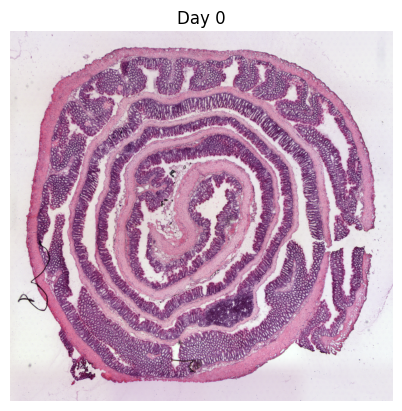

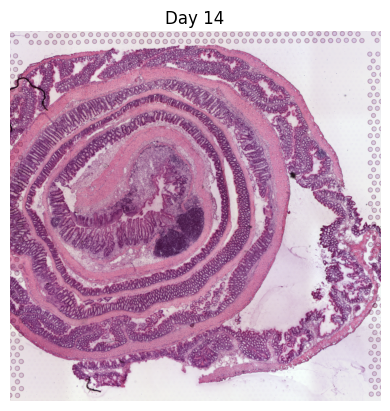

In [27]:
for ad_ in [d0_adata, d14_adata]:
    #with mplscience.style_context():
    cond = ad_.obs['cond'].unique()[0]
    sc.pl.spatial(ad_, frameon=False, title=cond, show=False, img_key='hires')

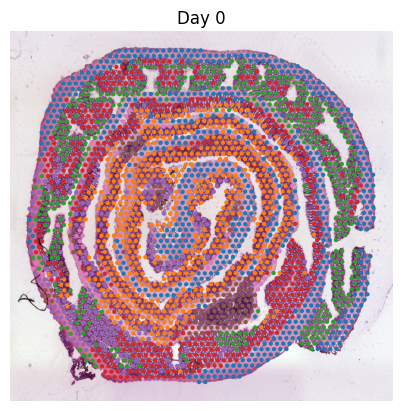

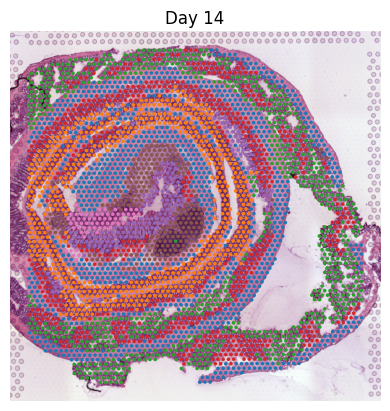

In [28]:
for ad_ in [d0_adata, d14_adata]:
    #with mplscience.style_context():
    cond = ad_.obs['cond'].cat.categories[0]
    sc.pl.spatial(ad_, color='top_super_module', frameon=False, spot_size=70, img_key="hires", legend_loc=None, title=cond, show=False)

### Step 8 — Characterize super-module abundance along anatomical axes

We use polynomial regression to quantify how each super-module's activity varies along two anatomical gradients:

- **Proximal-distal axis** (`ord`) — the position along the colon from the cecum (proximal) to the rectum (distal), encoded as a continuous rank-order coordinate from the digital unrolling.
- **Serosa-luminal axis** (`dist_norm`) — the depth from the outer serosa to the inner lumen, normalized within each proximal-distal bin.

For each condition separately, we fit a degree-3 polynomial to the Z-scored super-module score and display 95% bootstrap confidence intervals. Only super-modules that are the dominant zone in ≥1% of spots are shown (line width scales with spot fraction).

In [29]:
# Count spots assigned to each super-module per condition
fraction_data = adata.obs.groupby(['cond', 'top_super_module'])['cond'].count()

In [30]:
fraction_data = fraction_data.rename("n")
fraction_df = fraction_data.reset_index()
# Compute fractional abundance of each super-module within each condition
fraction_df["Fraction"] = fraction_data.groupby(level=0).apply(lambda x: x / float(x.sum())).values
fraction_df = fraction_df[fraction_df.n != 0]

In [31]:
fraction_df['cond'] = fraction_df['cond'].cat.reorder_categories(['Day 14', 'Day 0'])

In [32]:
conditions = adata.obs['cond'].cat.categories

In [33]:
from_cond_to_name = {
    'Day 0': 'd0',
    'Day 14': 'd14',
}

In [34]:
super_modules = adata.obsm['super_module_scores'].columns

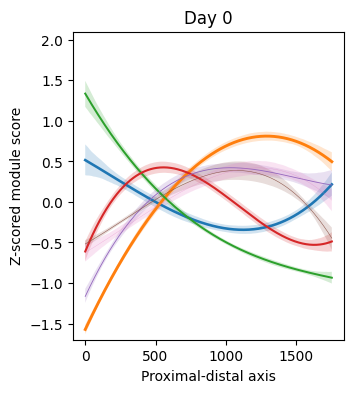

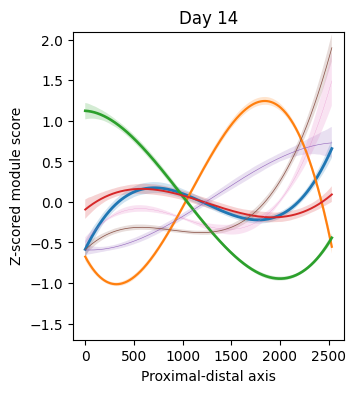

In [35]:
for cond in conditions:
    cond_adata = adata[adata.obs['cond'] == cond].copy()
    polynomial_regression(adata=cond_adata, cond=cond, super_modules=super_modules, fraction_df=fraction_df, var='ord', degree = 3, figsize=(3.5,4), xlabel='Proximal-distal axis', y_min=-1.7, y_max=2.1)
    plt.show()
    plt.close()

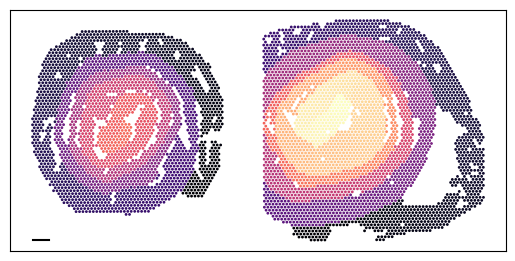

In [36]:
ax = plt.subplot(111)
ax.set_aspect('equal', adjustable='box')

distance = 500

ax.yaxis.set_ticks_position("left")
ax.xaxis.set_ticks_position("bottom")
plt.xticks([])
plt.yticks([])

x_start, y_start = min(adata.obsm['spatial'][:, 0]), max(adata.obsm['spatial'][:, 1])
x_end, y_end = x_start + distance, y_start

plt.scatter(
    adata.obsm['spatial'][:, 0],
    -adata.obsm['spatial'][:, 1],
    alpha=1,
    s=1,
    c=adata.obs['ord'],
    cmap='magma',
)

ax.plot([x_start, x_end], [-y_start, -y_end], color='black')

plt.show()
plt.close()

In [37]:
n_bins = 100
adata.obs['dist_norm'] = np.nan

# Normalize the serosa-luminal distance within each proximal-distal bin so that
# different positions along the colon are on a comparable scale.
for cond in conditions:
    cond_adata = adata[adata.obs['cond'] == cond].copy()
    cond_adata.obs['ord_bin'] = pd.cut(cond_adata.obs['ord'], bins=n_bins, labels=False)
    y_min_global = cond_adata.obs['dist'].min()
    y_max_global = cond_adata.obs['dist'].max()
    def dist_normalization(y):
        y_max = y.max()
        y_min = y.min()
        # Scale to [y_min_global, y_max_global/2] within each bin
        return y_min_global + (((y - y_min) / (y_max - y_min)) * (y_max_global / 2))
    cond_adata.obs['dist_norm'] = cond_adata.obs.groupby('ord_bin')['dist'].transform(dist_normalization)
    adata.obs['dist_norm'][adata.obs['cond'] == cond] = cond_adata.obs['dist_norm']

In [38]:
conditions = adata.obs['cond'].cat.categories

In [39]:
from_cond_to_name = {
    'Day 0': 'd0',
    'Day 14': 'd14',
}

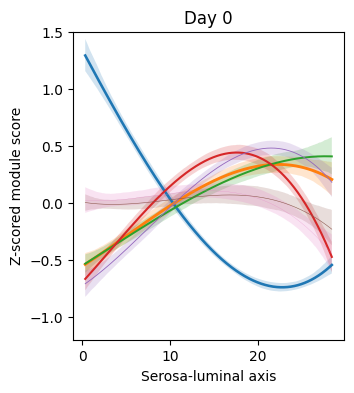

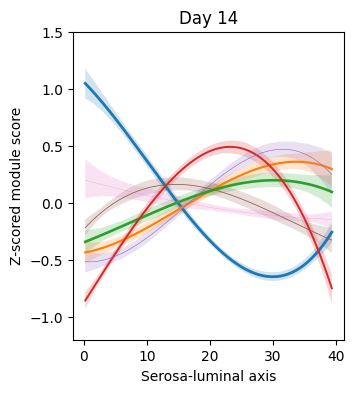

In [40]:
for cond in conditions:
    cond_adata = adata[adata.obs['cond'] == cond].copy()
    polynomial_regression(adata=cond_adata, cond=cond, super_modules=super_modules, fraction_df=fraction_df, var='dist_norm', degree = 3, figsize=(3.5,4), xlabel='Serosa-luminal axis', y_min=-1.2, y_max=1.5)
    plt.show()
    plt.close()

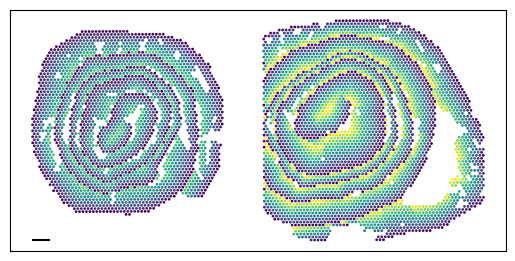

In [41]:
ax = plt.subplot(111)
ax.set_aspect('equal', adjustable='box')

distance = 500

ax.yaxis.set_ticks_position("left")
ax.xaxis.set_ticks_position("bottom")
plt.xticks([])
plt.yticks([])

x_start, y_start = min(adata.obsm['spatial'][:, 0]), max(adata.obsm['spatial'][:, 1])
x_end, y_end = x_start + distance, y_start

plt.scatter(
    adata.obsm['spatial'][:, 0],
    -adata.obsm['spatial'][:, 1],
    alpha=1,
    s=1,
    c=adata.obs['dist_norm'],
    cmap='viridis',
)

ax.plot([x_start, x_end], [-y_start, -y_end], color='black')

plt.show()
plt.close()

## Metabolic pathway enrichment (VISION)

Having identified spatially coherent gene modules, we now annotate each module with **KEGG metabolic pathways** using [VISION](https://yoseflab.github.io/VISION/). VISION computes per-cell signature scores from a set of gene signatures (here, KEGG metabolic pathways) and stores them in `adata.varm`. These scores are then correlated with the Hotspot module scores to determine which pathways are enriched in each spatial zone.

The workflow has three sub-steps:
1. Load KEGG metabolic gene sets from a JSON file.
2. Run VISION to score all pathways for each spot.
3. Integrate VISION pathway scores with Hotspot module scores to identify module-pathway associations.

In [42]:
# Path to the directory containing pre-downloaded KEGG metabolic gene-set JSON files
SIGNATURES_PATH = '/home/projects/nyosef/oier/Harreman_files/signatures'

In [43]:
# Load KEGG metabolic pathway gene sets (format: {pathway_name: [gene1, gene2, ...]})
with open(os.path.join(SIGNATURES_PATH, 'KEGG_metab_m.json')) as json_file:
    kegg_metab = json.load(json_file)

In [44]:
# Register the KEGG gene sets with the VISION module; they will be stored in adata.varm
ha.vs.signatures_from_file(dicts=[kegg_metab])

In [45]:
# Score every spot against all KEGG metabolic signatures using log-normalized counts
ha.vs.analyze_vision(norm_data_key="log_norm", signature_varm_key="signatures", scores_only=True)

INFO     Computing signatures for each cell...                                                                     
WARNING  PyTorch path failed (The NVIDIA driver on your system is too old (found version 12020). Please update your
         GPU driver by downloading and installing a new version from the URL:                                      
         http://www.nvidia.com/Download/index.aspx Alternatively, go to: https://pytorch.org to install a PyTorch  
         version that has been compiled with your version of the CUDA driver.); falling back to scipy sparse.      
INFO     Signatures computed in 0.737 s.                                                                           


In [46]:
# Correlate VISION pathway scores with super-module scores to find module-pathway associations
ha.hs.integrate_vision_hotspot_results(use_super_modules=True)

Integrating VISION and Hotspot results...
INFO     Computing signatures for each cell...                                                                     
WARNING  PyTorch path failed (The NVIDIA driver on your system is too old (found version 12020). Please update your
         GPU driver by downloading and installing a new version from the URL:                                      
         http://www.nvidia.com/Download/index.aspx Alternatively, go to: https://pytorch.org to install a PyTorch  
         version that has been compiled with your version of the CUDA driver.); falling back to scipy sparse.      
INFO     Signatures computed in 0.658 s.                                                                           
Finished integrating VISION and Hotspot results in 1.218 seconds


In [47]:
# Retrieve enrichment statistics: log2(enrichment score), p-values, and FDR per module–pathway pair
stats_df = ha.adata.uns['sig_mod_enrichment_stats'].copy()
pvals_df = ha.adata.uns['sig_mod_enrichment_pvals'].copy()
FDR_df = ha.adata.uns['sig_mod_enrichment_FDR'].copy()

In [48]:
# Mask non-significant associations (p >= 0.05) with NaN; drop pathways with no significant module
stats_df[pvals_df >= 0.05] = np.nan
FDR_df[pvals_df >= 0.05] = np.nan
pvals_df[pvals_df >= 0.05] = np.nan

stats_df = stats_df.dropna(axis=0, how='all')
FDR_df = FDR_df.dropna(axis=0, how='all')
pvals_df = pvals_df.dropna(axis=0, how='all')

In [51]:
for module in ha.adata.uns['gene_modules_sm'].keys():
    pathways = stats_df[module].sort_values(ascending=False).dropna().index
    int_genes = []
    print(f'{module}:')
    for pathway in pathways:
        kegg_genes = kegg_metab[pathway]
        mod_genes = ha.adata.uns['gene_modules_sm'][module]
        int_genes_pathway = list(set(kegg_genes) & set(mod_genes))
        print(f'{pathway}: {int_genes_pathway}')
        int_genes.extend(int_genes_pathway)

Module 1:
STARCH AND SUCROSE METABOLISM: ['Gaa', 'Pygm', 'Enpp1', 'Gbe1', 'Pygb']
Module 2:
STEROID BIOSYNTHESIS: ['Msmo1', 'Ebp', 'Dhcr7', 'Sc5d', 'Soat1', 'Fdft1', 'Sqle']
GLYCOSPHINGOLIPID BIOSYNTHESIS LACTO AND NEOLACTO SERIES: ['St3gal3', 'B4galt1', 'B3gnt5', 'St3gal6', 'St3gal4', 'B3galt5']
TERPENOID BACKBONE BIOSYNTHESIS: ['Hmgcr', 'Mvd', 'Hmgcs1', 'Fdps']
GLYCOLYSIS GLUCONEOGENESIS: ['Aldoa', 'Akr1a1', 'Pgam1', 'Aldh2', 'Gapdh', 'Aldoc', 'Pgk1', 'Eno3', 'Dlat', 'Hk2', 'Adh1', 'Pfkp', 'Hk1', 'Pkm', 'Acss2']
GLYCOSAMINOGLYCAN BIOSYNTHESIS KERATAN SULFATE: ['St3gal3', 'B3gnt7', 'Fut8', 'B4galt1']
FRUCTOSE AND MANNOSE METABOLISM: ['Aldoa', 'Aldoc', 'Hk2', 'Gmppb', 'Mpi', 'Pfkp', 'Hk1']
AMINO SUGAR AND NUCLEOTIDE SUGAR METABOLISM: ['Amdhd2', 'Cmas', 'Gfpt1', 'Hexb', 'Gne', 'Hk2', 'Gmppb', 'Mpi', 'Nans', 'Hk1']
CITRATE CYCLE TCA CYCLE: ['Mdh1', 'Suclg1', 'Sdhd', 'Dlat', 'Acly', 'Pcx', 'Idh3a']
Module 3:
RETINOL METABOLISM: ['Cyp2c55', 'Lrat', 'Dgat1', 'Cyp3a13', 'Aldh1a1', 'Adh5']
SE

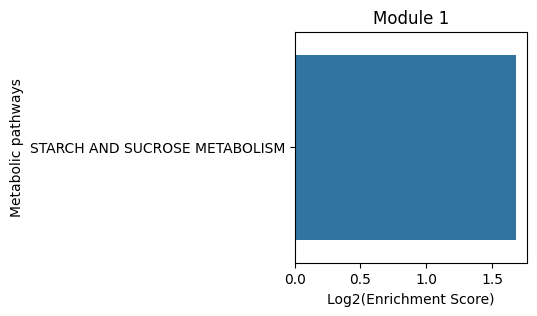

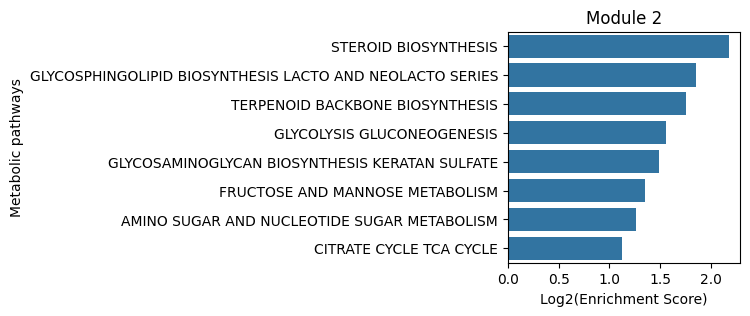

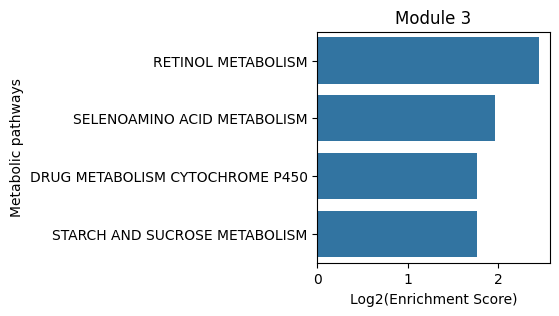

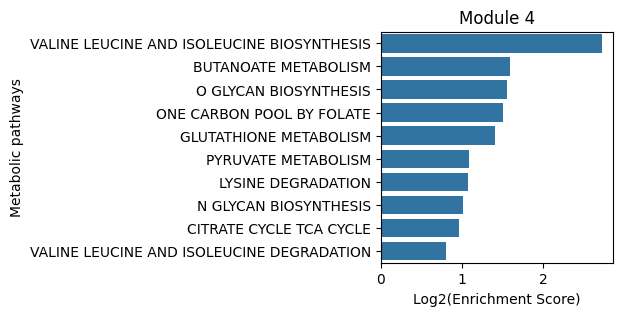

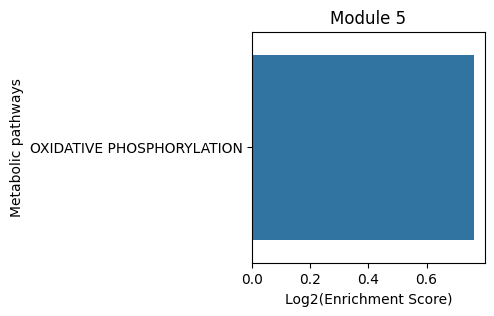

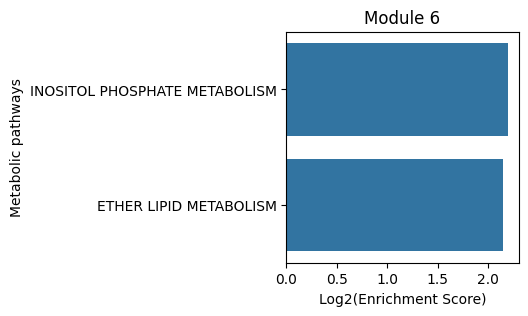

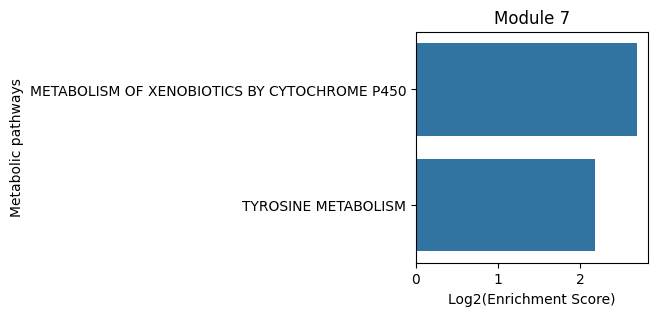

In [52]:
plot = True
df_dict = {}
for module in ha.adata.uns['gene_modules_sm'].keys():
    top_pathways = stats_df[module].sort_values(ascending=False).dropna()
    fig, ax = plt.subplots(figsize=(3, 3))
    ax2 = sns.barplot(x=top_pathways.values, y=top_pathways.index)
    # ax2 = sns.barplot(x=top_pathways.values, y=top_pathways.index, color=palette_m[module])
    ax.grid(visible=False)
    plt.xticks(rotation=0)
    plt.title(module)
    plt.xlabel('Log2(Enrichment Score)')
    plt.ylabel('Metabolic pathways')
    plt.show()
    plt.close()

## Cell-type-agnostic metabolic crosstalk

In this section, we move from identifying *where* metabolic programs are active to asking *what metabolites are being exchanged* between spatially adjacent spots. Harreman tests for statistically significant co-expression of metabolite **importer–exporter pairs** (from HarremanDB) and **ligand–receptor pairs** (from CellChatDB) across the spatial neighborhood graph. Because we do not have cell-type deconvolution information here, we infer crosstalk in a **cell-type-agnostic** mode.

### Setup

We initialize a new `HarremanAnalysis` object with the fully annotated AnnData (which now carries the super-module assignments from the zonation step). We load both the HarremanDB transporter database and the CellChatDB ligand–receptor database (`database='both'`) and restrict to **extracellular** interactions only (the default), as intracellular metabolite transport does not constitute cell–cell crosstalk.

`ha2.setup()` builds the spatial neighborhood graph and loads the interaction databases. The same `n_neighbors=5` and `sample_key='cond'` parameters as before prevent cross-sample edges.

In [29]:
# Initialize a fresh HarremanAnalysis object from the fully annotated AnnData.
# ha2.setup() builds the neighborhood graph and loads both transporter and LR databases.
ha2 = HarremanAnalysis(ha.adata, layer_key='counts')
ha2.setup(
    compute_neighbors_on_key='spatial_unrolled',
    species='mouse',
    database='both',     # load HarremanDB (transporters) + CellChatDB (LR pairs)
    n_neighbors=5,
    sample_key='cond',
)
print(ha2)

100%|██████████| 2/2 [00:00<00:00, 99.75it/s]

INFO     HarremanAnalysis: setup complete (species=mouse, database=both).                                          
HarremanAnalysis(is_set_up=True, is_deconvolved=False, completed_steps=['setup'])


The neighborhood graph is built using the same parameters as in the zonation step: `n_neighbors=5` in unrolled tissue space, binary weights, no cross-sample edges. It is reconstructed here because `ha2` is a fresh `HarremanAnalysis` object.

### Step 1 — Filter genes to spatially informative transporters/receptors

Before computing gene pairs, we filter the gene universe to those with significant spatial autocorrelation (`autocorrelation_filt=True`, DANB model). This reduces the number of interaction pairs tested and improves statistical power by focusing on genes that actually show spatial structure.

In [30]:
ha2.filter_genes(model='danb', autocorrelation_filt=True)

### Step 2 — Enumerate candidate interaction pairs

`compute_gene_pairs` constructs the list of all importer–exporter and ligand–receptor gene pairs present in the loaded databases and expressed (after filtering) in this dataset. Setting `ct_specific=False` treats each spot as a mixture of cell types without deconvolution; every expressed transporter is considered regardless of which cell type expresses it.

In [31]:
# Enumerate all transporter/LR gene pairs present in the databases and expressed in this dataset
ha2.compute_gene_pairs(ct_specific=False)  # no cell-type deconvolution

### Step 3 — Test for significant spatial co-expression of interaction pairs

`compute_cell_communication` scores each gene pair by the degree to which the two partner genes (e.g., an importer in spot A and its corresponding exporter in a neighboring spot B) are co-expressed across the tissue. Statistical significance is assessed by:

- **Parametric test** (`model='danb'`): fits a DANB model to the raw counts (`layer_key_p_test='counts'`) and evaluates significance analytically.
- **Non-parametric permutation test** (`n_permutations=1000`): shuffles spot labels 1,000 times to build a null distribution using log-normalized counts (`layer_key_np_test='log_norm'`).

Using `test='both'` runs both tests; downstream analyses will rely on the non-parametric FDR.

In [33]:
# Run the cell communication test:
# - parametric DANB test on raw counts
# - non-parametric permutation test (1000 permutations) on log-normalized counts
ha2.compute_cell_communication(
    mode='standard',
    model='danb',
    n_permutations=1000,
    test='both',
    layer_key_p_test="counts",
    layer_key_np_test="log_norm",
)

Permutation test: 100%|██████████| 1000/1000 [05:23<00:00,  3.09it/s]


We retain only interactions that are statistically significant at **FDR < 0.05** in the non-parametric permutation test. These are the gene pairs (and the metabolites/ligands they mediate) that show genuine spatial co-expression beyond what would be expected by chance.

In [34]:
# Retain only interactions passing FDR < 0.05 in the non-parametric test
ha2.select_significant_interactions(fdr_threshold=0.05, test='non-parametric')

### Step 4 — Compute per-spot interaction scores

To visualize *where* each metabolic interaction is active in the tissue, `compute_interacting_cell_scores` calculates a per-spot score for every significant gene pair and for each metabolite (aggregated across all its gene pairs). The score reflects the local co-expression strength of the two partner genes in a spot and its neighborhood.

The `test='both'` argument computes scores using both raw counts (parametric path) and log-normalized counts (non-parametric path). We will use the non-parametric scores for visualization.

In [35]:
# Compute per-spot interaction scores for all significant gene pairs and metabolites
# 'both': scores computed from raw counts (parametric) and log-normalized (non-parametric)
ha2.compute_interacting_cell_scores(mode='standard', test='both', n_permutations=1000)

Permutation test: 100%|██████████| 1000/1000 [04:09<00:00,  4.01it/s]


### Step 5 — Correlate interaction scores with metabolic module scores

To link specific metabolic exchanges to spatial zones, we compute the Pearson correlation between the per-spot metabolite interaction scores and the super-module scores. A high positive correlation between a metabolite and a super-module indicates that the exchange is preferentially active in the tissue region characterized by that metabolic program.

In [36]:
# Pearson-correlate metabolite interaction scores with super-module scores across spots
ha2.tl.compute_interaction_module_correlation(
    cor_method='pearson',
    use_super_modules=True,
    interaction_type='metabolite',  # aggregate scores at the metabolite level
    test='non-parametric',          # use log-normalized-count-based scores
)

### Downstream analyses

The heatmap shows metabolite interaction scores (rows) versus super-module scores (columns). Only correlations with |r| > `threshold` are shown. This lets us quickly identify which metabolic exchanges are enriched in each spatial zone.

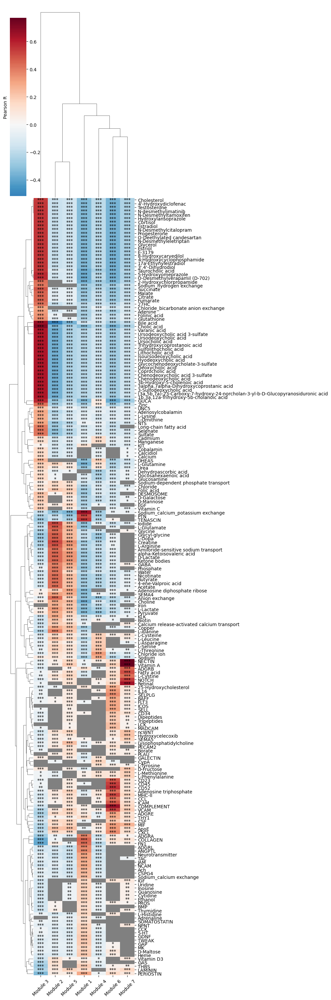

In [37]:
ha2.pl.plot_interaction_module_correlation(x_rotation = 45, figsize = (10,30), threshold = 0.1)

We select a representative set of metabolites that span several metabolic super-modules (based on the correlation heatmap above) and examine their spatial distribution in the tissue.

In [38]:
# Selected metabolites spanning multiple super-modules (chosen from correlation heatmap)
metabolites = ['Sodium_calcium_potassium exchange', 'Creatine', 'Cholic acid',
               'Adenosine triphosphate', 'Vitamin A', 'Lysophosphatidylcholine']

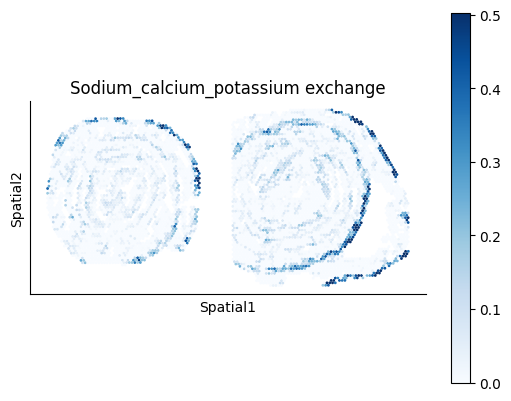

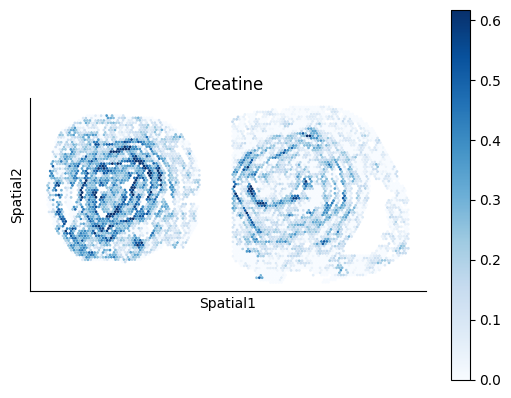

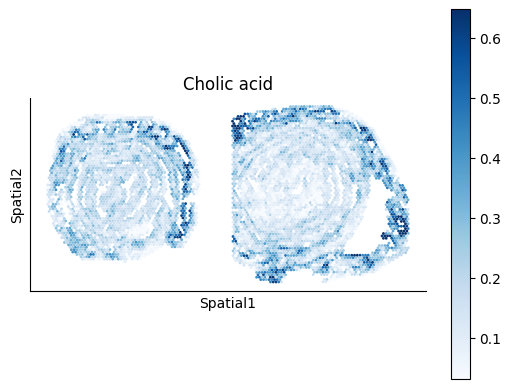

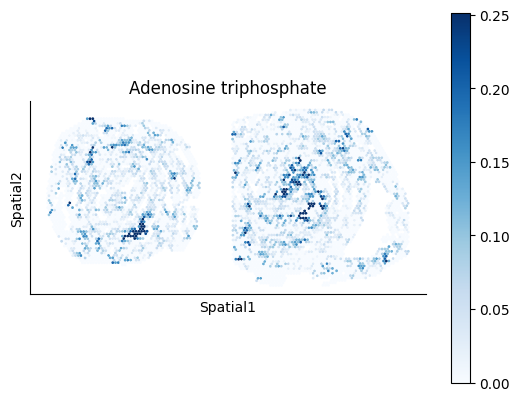

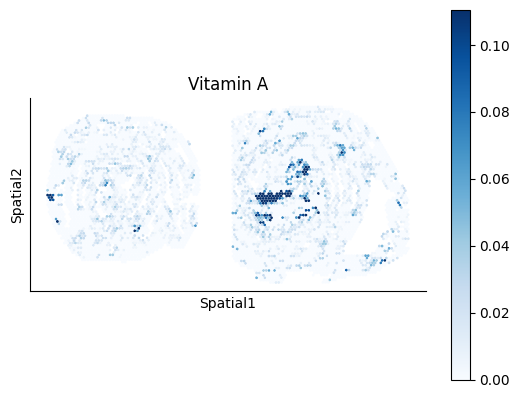

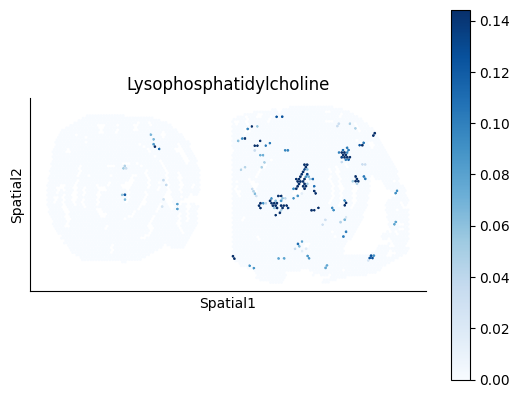

In [39]:
# Visualize spatial distribution of interaction scores for each selected metabolite
ha2.pl.plot_interacting_cell_scores(
    interactions=metabolites,
    test='non-parametric',
    coords_obsm_key='spatial',
    s=1, vmin='p5', vmax='p99',
    only_sig_values=False,
    normalize_values=True,
    cmap='Blues',
    swap_y_axis=True,
)

Beyond the tissue maps, we can quantify how each metabolite's interaction score varies across metabolic zones. We plot the normalized score distributions split by super-module and condition (Day 0 vs. Day 14) to reveal zone-specific and condition-specific metabolic exchanges.

In [40]:
# Extract non-parametric interaction scores for gene pairs and metabolites
interacting_cell_scores_gp = ha2.adata.uns['interacting_cell_results']['np']['gp']['cs']
interacting_cell_scores_m  = ha2.adata.uns['interacting_cell_results']['np']['m']['cs']

interacting_cell_scores_gp = pd.DataFrame(
    interacting_cell_scores_gp,
    index=ha2.adata.obs_names,
    columns=ha2.adata.uns['gene_pairs_sig_names'],
)
interacting_cell_scores_m = pd.DataFrame(
    interacting_cell_scores_m,
    index=ha2.adata.obs_names,
    columns=ha2.adata.uns['metabolites'],
)

# Separate the selected metabolites into gene pairs vs. metabolite-level entries
gene_pairs = [inter for inter in metabolites if inter in ha2.adata.uns['gene_pairs_sig_names']]
metabs     = [inter for inter in metabolites if inter in ha2.adata.uns['metabolites']]

if len(gene_pairs) > 0 and len(metabs) > 0:
    interacting_cell_scores = pd.concat([interacting_cell_scores_gp, interacting_cell_scores_m], axis=1)
elif len(gene_pairs) == 0 and len(metabs) == 0:
    raise ValueError("The provided LR pairs and/or metabolites don't have significant interactions.")
else:
    interacting_cell_scores = interacting_cell_scores_gp if len(gene_pairs) > 0 else interacting_cell_scores_m

# Min-max normalize each metabolite score to [0, 1] for comparable visualization
scores = interacting_cell_scores[metabolites]
scores = scores.apply(lambda x: (x - x.min()) / (x.max() - x.min()), axis=0)

In [41]:
# Join interaction scores with condition and super-module labels; drop unassigned spots
violin_data = pd.concat([scores, ha2.adata.obs[['cond', 'top_super_module']]], axis=1).dropna()

In [42]:
violin_data_melt = pd.melt(violin_data, id_vars=['cond', 'top_super_module'], value_vars=metabolites)

In [43]:
cond_palette = {
    'Day 0': '#ffbb78',
    'Day 14': '#c5b0d5',
}

In [44]:
violin_data_melt['cond'] = violin_data_melt['cond'].astype('category')
violin_data_melt['variable'] = violin_data_melt['variable'].astype('category')

In [45]:
violin_data_melt['variable'] = violin_data_melt['variable'].astype('category')
violin_data_melt['variable'] = violin_data_melt['variable'].cat.reorder_categories(metabolites)

In [ ]:
fig = (
ggplot(data=violin_data_melt, mapping=aes(x='cond', y='value', fill='cond')) 
+ geom_violin(size=0.9)
+ geom_boxplot(width=0.1, fill='white', size=0.3)
+ facet_grid(rows='variable', cols='top_super_module')
+ scale_fill_manual(values=cond_palette)
# + xlab('')
+ ylab('Normalized metabolite score')
+ theme_classic() 
+ theme(plot_title = element_text(hjust = 0.5,
                                margin={"t": 0, "b": 5, "l": 0, "r": 0},
                                size = 14,
                                face='bold'),
        legend_position = "none",
        axis_title_x = element_blank(),
        axis_title_y = element_text(size = 11),
        axis_text_x = element_text(margin={"t": 0, "b": 0, "l": 0, "r": 10}, size = 10, colour='black', rotation=45),
        axis_text_y = element_text(margin={"t": 0, "b": 0, "l": 0, "r": 10}, size = 10, colour='black'),
        panel_border = element_rect(color='black'),
        panel_background = element_rect(colour = "black",
                                        linewidth = 1),
        figure_size=(10, 8))
)
fig.show()

NameError: name 'ggplot' is not defined

We can also drill down from metabolites to the individual **transporter/receptor gene pairs** that mediate each exchange. The bubble plot below shows, for each selected metabolite, which specific importer–exporter or ligand–receptor pairs have significant spatial co-expression, colored by log₁₀ co-expression score and sized by −log₁₀(FDR).

In [46]:
# Load the significant gene-pair interaction table (non-parametric test)
cell_communication_df = ha2.adata.uns['ccc_results']['cell_com_df_gp_sig'].copy()

In [47]:
gene_pairs_per_metabolite = ha2.adata.uns['gene_pairs_per_metabolite']
    
def to_tuple(x):
    # Recursively convert lists to tuples
    if isinstance(x, list):
        return tuple(to_tuple(i) for i in x)
    return x

metabolite_gene_pair_df = pd.DataFrame.from_dict(gene_pairs_per_metabolite, orient="index").reset_index()
metabolite_gene_pair_df = metabolite_gene_pair_df.rename(columns={"index": "metabolite"})
metabolite_gene_pair_df['gene_pair'] = metabolite_gene_pair_df['gene_pair'].apply(
    lambda arr: [(to_tuple(gp[0]), to_tuple(gp[1])) for gp in arr]
)
metabolite_gene_pair_df['gene_type'] = metabolite_gene_pair_df['gene_type'].apply(
    lambda arr: [(to_tuple(gt[0]), to_tuple(gt[1])) for gt in arr]
)
metabolite_gene_pair_df = pd.concat([
    metabolite_gene_pair_df['metabolite'],
    metabolite_gene_pair_df.explode('gene_pair')['gene_pair'],
    metabolite_gene_pair_df.explode('gene_type')['gene_type'],
], axis=1).reset_index(drop=True)

if 'LR_database' in ha2.adata.uns:
    LR_database = ha2.adata.uns['LR_database']
    df_merged = pd.merge(metabolite_gene_pair_df, LR_database, left_on='metabolite', right_on='interaction_name', how='left')
    LR_df = df_merged.dropna(subset=['pathway_name'])
    metabolite_gene_pair_df['metabolite'][metabolite_gene_pair_df.metabolite.isin(LR_df.metabolite)] = LR_df['pathway_name']

In [48]:
metabolite_gene_pair_df = metabolite_gene_pair_df.set_index('metabolite')

In [49]:
def is_present(row, gene_pairs):
    gene1, gene2 = row['Gene 1'], row['Gene 2']
    return any(
        (gene1 in pair and gene2 in pair) if isinstance(pair, tuple) else False
        for pair in gene_pairs
    )

gene_pairs = metabolite_gene_pair_df.loc[metabolites]['gene_pair'].tolist()
cell_communication_df_filt = cell_communication_df[cell_communication_df.apply(lambda row: is_present(row, gene_pairs), axis=1)]

In [50]:
gene_pairs_filt = list(zip(cell_communication_df_filt["Gene 1"], cell_communication_df_filt["Gene 2"]))

In [51]:
gene_1 = ["_".join(pair[0]) if isinstance(pair[0], list) else pair[0] for pair in gene_pairs]
gene_2 = ["_".join(pair[1]) if isinstance(pair[1], list) else pair[1] for pair in gene_pairs]

def remove_duplicates(lst):
    seen = set()
    return [x for x in lst if not (x in seen or seen.add(x))]

gene_1 = remove_duplicates(gene_1)
gene_2 = remove_duplicates(gene_2)

In [52]:
cell_communication_df_filt['log10_FDR'] = -np.log10(cell_communication_df_filt['FDR_np'])
cell_communication_df_filt['log10_C'] = np.log10(cell_communication_df_filt['C_np'])

In [53]:
def convert_list_to_string(value):
    return '_'.join(value) if isinstance(value, list) else value

# Apply conversion to both columns
cell_communication_df_filt['Gene 1'] = cell_communication_df_filt['Gene 1'].apply(convert_list_to_string)
cell_communication_df_filt['Gene 2'] = cell_communication_df_filt['Gene 2'].apply(convert_list_to_string)

In [54]:
gene_1 = [gene for gene in gene_1 if gene in cell_communication_df_filt['Gene 1'].unique()]
gene_2 = [gene for gene in gene_2 if gene in cell_communication_df_filt['Gene 2'].unique()]

In [55]:
cell_communication_df_filt['Gene 1'] = cell_communication_df_filt['Gene 1'].astype('category')
cell_communication_df_filt['Gene 1'] = cell_communication_df_filt['Gene 1'].cat.reorder_categories(gene_1[::-1])

cell_communication_df_filt['Gene 2'] = cell_communication_df_filt['Gene 2'].astype('category')
cell_communication_df_filt['Gene 2'] = cell_communication_df_filt['Gene 2'].cat.reorder_categories(gene_2)

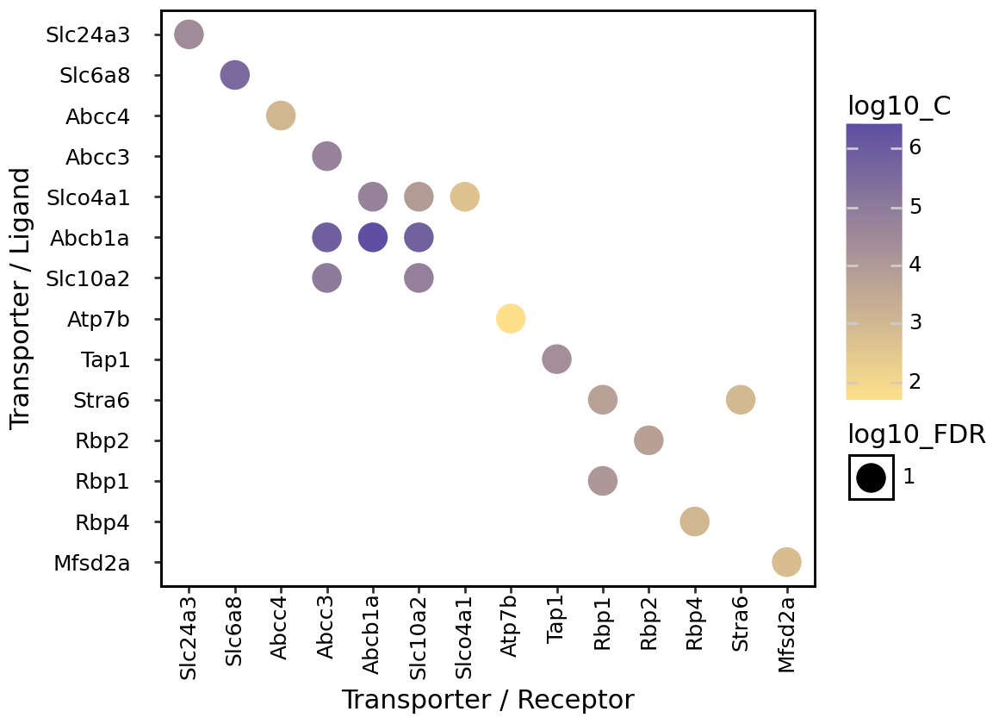

In [ ]:
fig = (
ggplot(data=cell_communication_df_filt, mapping=aes(x='Gene 2', y='Gene 1', color='log10_C', size='log10_FDR')) 
+ geom_point()
+ scale_color_gradient(low = "#FEE08B", high = "#5E4FA2")
+ theme_classic() 
+ theme(plot_title = element_text(hjust = 0.5,
                                margin={"t": 0, "b": 5, "l": 0, "r": 0},
                                size = 14,
                                face='bold'),
        # legend_position = "none",
        axis_title_x = element_text(size = 11),
        axis_title_y = element_text(size = 11),
        axis_text_x = element_text(margin={"t": 0, "b": 0, "l": 0, "r": 10}, size = 9, colour='black', rotation=90),
        axis_text_y = element_text(margin={"t": 0, "b": 0, "l": 0, "r": 10}, size = 9, colour='black'),
        panel_border = element_rect(color='black'),
        panel_background = element_rect(colour = "black",
                                        linewidth = 1),
        figure_size=(5.8, 4.2)) + ylab('Transporter / Ligand') + xlab('Transporter / Receptor')
)
fig.show()

### Grouping spatially co-localized metabolites into metabolite modules

Having identified individual significant metabolic exchanges, we now ask whether groups of metabolites are consistently **co-active in the same tissue regions**. To do this, we binarize the metabolite interaction scores: spots with a score more than 1 standard deviation above the mean are assigned 1 (interaction is locally active), and 0 otherwise. This converts continuous scores into a spatial presence/absence map for each metabolite.

In [56]:
interacting_cell_scores_m = ha2.adata.uns['interacting_cell_results']['np']['m']['cs'].copy()
n = 1  # threshold: mean + 1 SD
means = np.nanmean(interacting_cell_scores_m, axis=0)
stds  = np.nanstd(interacting_cell_scores_m, axis=0)
thresholds = means + n * stds
# Set scores below threshold to 0 (interaction not locally active in that spot)
interacting_cell_scores_m[interacting_cell_scores_m < thresholds] = 0

In [57]:
interacting_cell_scores_m = pd.DataFrame(interacting_cell_scores_m, index=ha2.adata.obs_names, columns=ha2.adata.uns['metabolites'])

In [58]:
# Convert to binary presence/absence
interacting_cell_scores_m[interacting_cell_scores_m != 0] = 1

We pack the binarized metabolite scores into a new AnnData object — one observation per tissue spot, one variable per metabolite — so that we can run the same Hotspot zonation pipeline on metabolites instead of genes. The spatial coordinates and condition labels are copied from the original AnnData.

In [61]:
# Pack binarized metabolite scores into a new AnnData for the Hotspot pipeline
metab_scores_adata = ad.AnnData(interacting_cell_scores_m)
metab_scores_adata.obs_names = ha2.adata.obs_names
metab_scores_adata.var_names = ha2.adata.uns['metabolites']

# Transfer spatial coordinates and condition labels
metab_scores_adata.obs['cond']                  = ha2.adata.obs['cond']
metab_scores_adata.obsm['spatial_unrolled']     = ha2.adata.obsm['spatial_unrolled']
metab_scores_adata.obsm['spatial']              = ha2.adata.obsm['spatial']

In [62]:
metab_scores_adata

AnnData object with n_obs × n_vars = 6168 × 231
    obs: 'cond'
    obsm: 'spatial_unrolled', 'spatial'

We rebuild the spatial neighborhood graph on this metabolite-level AnnData using the same parameters as before (5 nearest neighbors in unrolled space, per-sample graph, binary weights).

In [63]:
ha_metab = HarremanAnalysis(metab_scores_adata)
ha_metab.tl.compute_knn_graph(compute_neighbors_on_key="spatial_unrolled", 
                           n_neighbors=5,
                           weighted_graph=False,
                           sample_key='cond')

100%|██████████| 2/2 [00:00<00:00, 86.64it/s]


We compute spatial autocorrelation on the binarized metabolite scores to filter out metabolites that are uniformly expressed (or uniformly absent) across the tissue and would not contribute informative signal to the pairwise correlation step. The **Bernoulli model** (`model='bernoulli'`) is appropriate here because the data are binary (0/1). Note that we are not using the autocorrelation FDR to select metabolites — they have already been filtered by the significance test in `select_significant_interactions`. This step merely removes metabolites with all-zero values in at least one sample.

In [64]:
# Bernoulli model is appropriate for binary (0/1) data
ha_metab.hs.compute_local_autocorrelation(model='bernoulli')

In [65]:
gene_autocorrelation_results = metab_scores_adata.uns['gene_autocorrelation_results']
# Use all metabolites that passed QC (not restricted by FDR here — pre-filtered by CCC test)
metabolites = gene_autocorrelation_results.index

We compute pairwise local correlations between metabolite scores, exactly as we did for genes in the zonation step. Metabolites that are frequently co-active in the same spatial neighborhoods will have high local correlation Z-scores.

In [66]:
ha_metab.hs.compute_local_correlation(genes=metabolites, verbose=True)

Computing pair-wise local correlation on 231 features...
Pair-wise local correlation results are stored in adata.uns with the following keys: ['lcs', 'lc_zs', 'lc_z_pvals', 'lc_z_FDR']
Finished computing pair-wise local correlation in 0.109 seconds


We apply agglomerative clustering to the metabolite local-correlation matrix to form **metabolite modules** — groups of metabolites that tend to be co-active in the same tissue regions. A smaller `min_gene_threshold` (10 instead of 20) is used here because the number of metabolites is much smaller than the number of genes.

In [67]:
# Cluster metabolites into co-active groups; smaller min_gene_threshold because fewer metabolites
ha_metab.hs.create_modules(min_gene_threshold=10)

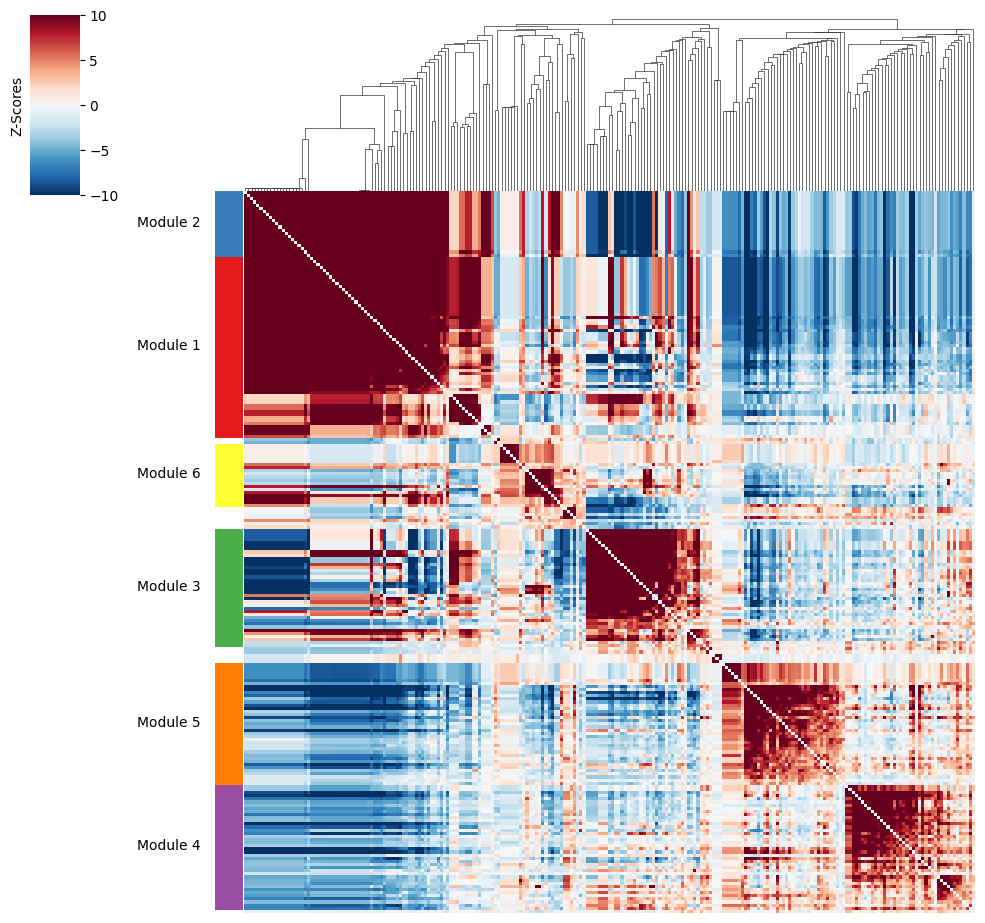

In [68]:
ha_metab.pl.local_correlation_plot(mod_cmap='Set1')

Finally, we compute per-spot scores for each metabolite module, visualize them spatially, and (in downstream analyses) correlate them with the gene-level super-module scores to link metabolic zone identity with the specific metabolite exchanges occurring within each zone.

In [69]:
ha_metab.hs.calculate_module_scores()

100%|██████████| 6/6 [00:02<00:00,  2.67it/s]


In [70]:
# Copy metabolite module scores to obs for spatial visualization
modules = metab_scores_adata.obsm['module_scores'].columns
metab_scores_adata.obs[modules] = metab_scores_adata.obsm['module_scores']

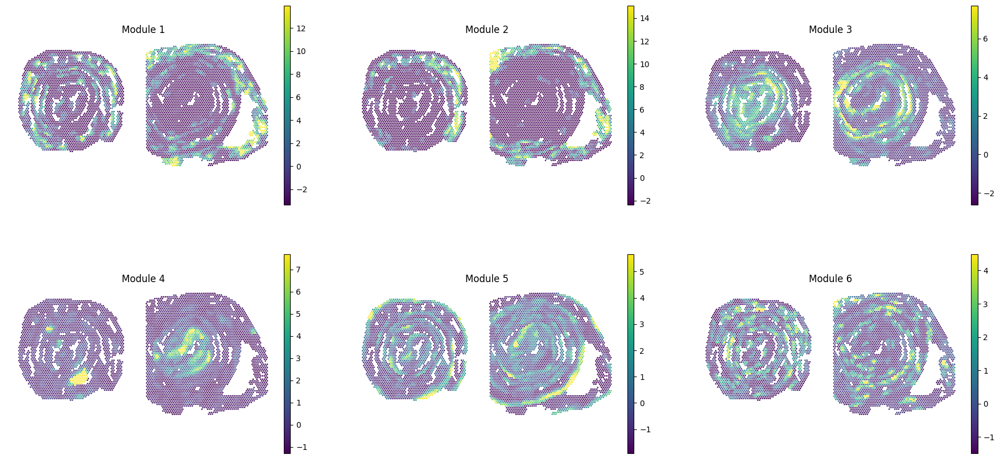

In [71]:
sc.pl.spatial(metab_scores_adata, color=modules, spot_size=80, frameon=False, vmin="p1", vmax="p99", ncols=3, cmap='viridis')

In [72]:
import gc
gc.collect()
import torch
torch.cuda.empty_cache()